<a href="https://colab.research.google.com/github/pippowell/OptiVisT/blob/main/ssdmobilenetv2_grapes_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Transfer Learning of SSD-MobileNet on a Custom Grapes Dataset

This notebook loads the SSD-MobileNet v2 network contained in the TensorFlow object detection zoo then applies it in a pre-trained state to a custom-made dataset containing 100 images of green and purple grapes which it uses to learn to detect grapes in images and, later, test the model with few images.

This notebook was adapted from that created by Edje Electronics for transfer learning with pre-trained TF models. Where custom code from that notebook is used directly in this notebook, this is clearly noted. All other code is either custom code written by us or is standard-use code that would be the same in any call of a respective file or command. The text in this notebook has been almost entirely updated, but some sections are reused and this is clearly noted when the case. 

Links to Originals:

[Edje Electronics Colab](https://colab.research.google.com/github/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/Train_TFLite2_Object_Detction_Model.ipynb)

[Edje Electronics GitHub Repository](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi)

#1.&nbsp;Install TensorFlow Object Detection Dependencies

We first install the TensorFlow Object Detection API by cloning the [TensorFlow models repository](https://github.com/tensorflow/models) and completing the appropriate setup steps. 


In [ ]:
# Clone the tensorflow models repository from GitHub
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 3708, done.
remote: Counting objects: 100% (3708/3708), done.
remote: Compressing objects: 100% (2825/2825), done.
remote: Total 3708 (delta 1054), reused 1815 (delta 834), pack-reused 0
Receiving objects: 100% (3708/3708), 48.71 MiB | 18.87 MiB/s, done.
Resolving deltas: 100% (1054/1054), done.
Updating files: 100% (3370/3370), done.


In [ ]:
# Copy the setup files into a local models/research folder
%%bash
cd models/research/

# use protoc to create .py files from the .proto files contained in the repository
protoc object_detection/protos/*.proto --python_out=.

In [ ]:
# Modify setup.py file to install the tf-models-official repository
# TF 2.10 has compatibility issues with Colab, so we set the required TF version to be above this version. 

import re
with open('/content/models/research/object_detection/packages/tf2/setup.py') as f:
    s = f.read()

with open('/content/models/research/setup.py', 'w') as f:
    # Set fine_tune_checkpoint path
    s = re.sub('tf-models-official>=2.5.1',
               'tf-models-official>=2.11.0', s)
    f.write(s)

In [ ]:
# Install the Object Detection API
# package dependency errors can be ignored here

!pip install /content/models/research/

We then run the `model_builder_tf2_test.py` script from the API to make sure all scripts and files are working properly (this directly tests the model_builder file from the API, which governs how models are created and referenced).

In [ ]:
!python /content/models/research/object_detection/builders/model_builder_tf2_test.py

# 2.&nbsp;Upload Image Dataset and Prepare Training Data

In this section, we will upload our custom grapes dataset and prepare it for training by creating train, test, and validation sets.

## 2.1 Clone our personal GitHub repository which contains the grapes dataset

In [ ]:
!git clone https://github.com/pippowell/OptiVisT.git

Cloning into 'TFGr10FinalProject'...
remote: Enumerating objects: 918, done.
remote: Total 918 (delta 0), reused 0 (delta 0), pack-reused 918
Receiving objects: 100% (918/918), 113.74 MiB | 9.77 MiB/s, done.
Resolving deltas: 100% (364/364), done.
Updating files: 100% (543/543), done.


## 2.2 Set up the train, validation, and test folders

Our repo contains a finished dataset which already splits our grape images into train, validation, and test folders. Here we will simply set up these folders in our Colab instance. 

The notebook this notebook is adapted from contained the following handy reminder of the purpose of each set (urgo Copyright Edje Electronics):



*   **Train**: These are the actual images used to train the model. In each step of training, a batch of images from the "train" set is passed into the neural network. The network predicts classes and locations of objects in the images. The training algorithm calculates the loss (i.e. how "wrong" the predictions were) and adjusts the network weights through backpropagation.


*   **Validation**: Images from the "validation" set can be used by the training algorithm to check the progress of training and adjust hyperparameters (like learning rate). Unlike "train" images, these images are only used periodically during training (i.e. once every certain number of training steps).


* **Test**: These images are never seen by the neural network during training. They are intended to be used by a human to perform final testing of the model to check how accurate the model is.

In [ ]:
!mv "/content/OptiVisT/dataset/prepared_fruithand_ds" "/content/"

## 3.3 Create Labelmap and TFRecords Files

We first need to tell our object detection model what objects it will be looking for. When using the API, this is done in a file called the "Labelmap," which is simply a specially formatted text file containing the categories we want to detect. In our case, we simply include "grape" since this is the only type of object we want our model to detect.

In [ ]:
%%bash
cat <<EOF >> /content/labelmap.txt
grape
apple
banana
orange
hand
EOF

Now that we have our labelmap, we need to convert our images into TFRecord files, which are special files used for training models in TensorFlow. To do this, we simply use the data conversion scripts from the [GitHub repository](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi) of the notebook this one is modelled on. Note that in that notebook, conversion from xml to csv files was also needed, which is not needed here as our custom dataset already provides annotations in csv format. 

In [ ]:
# Download the csv to TFRecord conversion script 
! wget https://raw.githubusercontent.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/master/util_scripts/create_tfrecord.py

In [ ]:
# Create the TFRecord files

!python3 create_tfrecord.py --csv_input=prepared_fruithand_ds/train/train_labels.csv --labelmap=labelmap.txt --image_dir=prepared_fruithand_ds/train --output_path=train.tfrecord
!python3 create_tfrecord.py --csv_input=prepared_fruithand_ds/val_labels.csv --labelmap=labelmap.txt --image_dir=prepared_fruithand_ds/val --output_path=val.tfrecord

2023-04-17 22:40:21.386291: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-04-17 22:40:22.967676: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-04-17 22:40:25.561630: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-04-17 22:40:25.601703: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:996] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

Store the locations of the created files as variables that can be called later for convenience. 

In [ ]:
train_record_fname = '/content/train.tfrecord'
val_record_fname = '/content/val.tfrecord'
label_map_pbtxt_fname = '/content/labelmap.pbtxt'

# 4.&nbsp;Set Up Training Configuration

Now we need to configure SSD-MobileNet v2 and the training pipeline we will use. For now, we specify which model from the API zoo we want to use and provide the name of the base training pipeline path. Note that in this version of the notebook, we reference the appropriate checkpoint file so that the model is loaded pre-trained.

In [ ]:
model_name = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'
base_pipeline_file = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.config'
pretrained_checkpoint = 'ssd_mobilenet_v2_320x320_coco17_tpu-8.tar.gz'

Now we create a folder for holding the model's files and then download the model's configuration file from the zoo.

In [ ]:
# Create "mymodel" folder for holding pre-trained weights and configuration files
%mkdir /content/models/mymodel/
%cd /content/models/mymodel/

# Download pre-trained model weights
import tarfile
download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint
!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

# Download training configuration file for model
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

Here we set the usual hyperparameters for training our model, including the number of training steps (epochs) and the batch size. Note that when using Google Colab, a batch size of 4 is used because we compare this model to SSD-EfficientNet which can only train in Colab with a batch size of 4 due to memory constraints. 

In [ ]:
# Set training parameters for the model
num_steps = 2000
batch_size = 16

We also need to tell our configuration where the training pipeline file is. Since we are using the network in a pre-trained state here, we also specify the location of the checkpoint file it will load the weights from. Once we specify the file locations, we then determine the number of classes being detected based on our Labelmap file from earlier, as this is information which also needs to be added to the config file. 

Note that this code is largely taken directly from the original notebook this notebook is based on. 

In [ ]:
# Define file locations 

pipeline_fname = '/content/models/mymodel/' + base_pipeline_file
fine_tune_checkpoint = '/content/models/mymodel/' + model_name + '/checkpoint/ckpt-0'

# Calculate the number of classes being detected based on the Labelmap file 

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())
num_classes = get_num_classes(label_map_pbtxt_fname)
print('Total classes:', num_classes)


Total classes: 1


Now we need to input all of the above information into the config file which will define and then train the model on our dataset. 

Note that this section is taken from the original notebook this notebook is based on, with only the learning rate section modified by us. 

In [ ]:
# Create custom configuration file by writing the dataset, model checkpoint, and training parameters into the base pipeline file
import re

%cd /content/models/mymodel
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:
    
    # Set fine_tune_checkpoint path
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)
    
    # Set tfrecord files for train and test datasets
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(val_record_fname), s)

    # Set label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set batch_size
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)
    
    # Set number of classes num_classes
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    # Change fine-tune checkpoint type from "classification" to "detection"
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)
    
    # If using ssd-mobilenet-v2, reduce learning rate (because it's too high in the default config file)
    s = re.sub('learning_rate_base: .8',
                'learning_rate_base: .10', s)
    
    s = re.sub('warmup_learning_rate: 0.13333',
                'warmup_learning_rate: .03', s)
    

    f.write(s)


/content/models/mymodel
writing custom configuration file


In [ ]:
# Display the custom configuration file's contents
!cat /content/models/mymodel/pipeline_file.config

Set the config and model output locations as variables for easier referencing later. 

In [ ]:
# Set the path to the custom config file and the directory to store training checkpoints in
pipeline_file = '/content/models/mymodel/pipeline_file.config'
model_dir = '/content/training/'

# 5.&nbsp;Train Custom TFLite Detection Model

Now we train our model!

First, we load the tensorboard so we can monitor the training progress. We also define a location for the tensorboard logs. 




In [ ]:
%load_ext tensorboard
%tensorboard --logdir '/content/training/train'

<IPython.core.display.Javascript object>

When using the API, the "model_main_tf2.py" script contained in it controls the training based on the parameters we have set above.

Note that the script only outputs a training progress report every 100 steps (epochs) so it can appear that the program is not doing anything at times. Monitor the memory load in the Resources tab in Colab to make sure training has not stopped. 

In [ ]:
# Run training!
!python /content/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1

# 6.&nbsp;Convert Model to TensorFlow Lite

With our model now trained and ready, we convert it to TF Lite format, which is more compact and usable than the original files. The model map containing information on the architecture and weights is translated into this format using the provided `export_tflite_graph_tf2.py` script from the API. 

This block is taken from the original Colab notebook. 

In [ ]:
# Make a directory to store the trained TFLite model
!mkdir /content/custom_model_lite
output_directory = '/content/custom_model_lite'

# Path to training directory (the conversion script automatically chooses the highest checkpoint file)
last_model_path = '/content/training'

!python /content/models/research/object_detection/export_tflite_graph_tf2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

# Convert exported graph file into TFLite model file
import tensorflow as tf

converter = tf.lite.TFLiteConverter.from_saved_model('/content/custom_model_lite/saved_model')
tflite_model = converter.convert()

with open('/content/custom_model_lite/detect.tflite', 'wb') as f:
  f.write(tflite_model)

# 7.&nbsp;Test TensorFlow Lite Model

Now we are ready to test our model on the images in the test folder, which it has never seen before. 

### 7.1 Inference test images
This code will load the test images, run the model on them, and then display the results. 

It also optionally saves detection results as text files so we can use them to calculate model mAP score, though we do not do this here.

This code is based on the [TFLite_detection_image.py](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py) script from the [Edje Electronics GitHub repository](https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi) and is identical to that found in the original notebook this notebook is based on. 

In [ ]:
# Script to run custom TFLite model on test images to detect objects
# Source: https://github.com/EdjeElectronics/TensorFlow-Lite-Object-Detection-on-Android-and-Raspberry-Pi/blob/master/TFLite_detection_image.py

# Import packages
import os
import cv2
import numpy as np
import sys
import glob
import random
import importlib.util
from tensorflow.lite.python.interpreter import Interpreter

import matplotlib
import matplotlib.pyplot as plt

%matplotlib inline

### Define function for inferencing with TFLite model and displaying results

def tflite_detect_images(modelpath, imgpath, lblpath, min_conf=0.5, num_test_images=10, savepath='/content/results', txt_only=False):

  # Grab filenames of all images in test folder
  images = glob.glob(imgpath + '/*.jpg') + glob.glob(imgpath + '/*.JPG') + glob.glob(imgpath + '/*.png') + glob.glob(imgpath + '/*.bmp')

  # Load the label map into memory
  with open(lblpath, 'r') as f:
      labels = [line.strip() for line in f.readlines()]

  # Load the Tensorflow Lite model into memory
  interpreter = Interpreter(model_path=modelpath)
  interpreter.allocate_tensors()

  # Get model details
  input_details = interpreter.get_input_details()
  output_details = interpreter.get_output_details()
  height = input_details[0]['shape'][1]
  width = input_details[0]['shape'][2]

  float_input = (input_details[0]['dtype'] == np.float32)

  input_mean = 127.5
  input_std = 127.5

  # Randomly select test images
  images_to_test = random.sample(images, num_test_images)

  # Loop over every image and perform detection
  for image_path in images_to_test:

      # Load image and resize to expected shape [1xHxWx3]
      image = cv2.imread(image_path)
      image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
      imH, imW, _ = image.shape 
      image_resized = cv2.resize(image_rgb, (width, height))
      input_data = np.expand_dims(image_resized, axis=0)

      # Normalize pixel values if using a floating model (i.e. if model is non-quantized)
      if float_input:
          input_data = (np.float32(input_data) - input_mean) / input_std

      # Perform the actual detection by running the model with the image as input
      interpreter.set_tensor(input_details[0]['index'],input_data)
      interpreter.invoke()

      # Retrieve detection results
      boxes = interpreter.get_tensor(output_details[1]['index'])[0] # Bounding box coordinates of detected objects
      classes = interpreter.get_tensor(output_details[3]['index'])[0] # Class index of detected objects
      scores = interpreter.get_tensor(output_details[0]['index'])[0] # Confidence of detected objects

      detections = []

      # Loop over all detections and draw detection box if confidence is above minimum threshold
      for i in range(len(scores)):
          if ((scores[i] > min_conf) and (scores[i] <= 1.0)):

              # Get bounding box coordinates and draw box
              # Interpreter can return coordinates that are outside of image dimensions, need to force them to be within image using max() and min()
              ymin = int(max(1,(boxes[i][0] * imH)))
              xmin = int(max(1,(boxes[i][1] * imW)))
              ymax = int(min(imH,(boxes[i][2] * imH))) # [This needs to be change i2 + ymin]
              xmax = int(min(imW,(boxes[i][3] * imW))) # [This needs to be change i3 + xmin]
              
              cv2.rectangle(image, (xmin,ymin), (xmax,ymax), (10, 255, 0), 2)

              # Draw label
              object_name = labels[int(classes[i])] # Look up object name from "labels" array using class index
              label = '%s: %d%%' % (object_name, int(scores[i]*100)) # Example: 'person: 72%'
              labelSize, baseLine = cv2.getTextSize(label, cv2.FONT_HERSHEY_SIMPLEX, 0.7, 2) # Get font size
              label_ymin = max(ymin, labelSize[1] + 10) # Make sure not to draw label too close to top of window
              cv2.rectangle(image, (xmin, label_ymin-labelSize[1]-10), (xmin+labelSize[0], label_ymin+baseLine-10), (255, 255, 255), cv2.FILLED) # Draw white box to put label text in
              cv2.putText(image, label, (xmin, label_ymin-7), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 0), 2) # Draw label text

              detections.append([object_name, scores[i], xmin, ymin, xmax, ymax])

      
      # All the results have been drawn on the image, now display the image
      if txt_only == False: # "text_only" controls whether we want to display the image results or just save them in .txt files
        image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
        plt.figure(figsize=(12,16))
        plt.imshow(image)
        plt.show()
      
      # Save detection results in .txt files (for calculating mAP)
      elif txt_only == True:

        # Get filenames and paths
        image_fn = os.path.basename(image_path)      
        base_fn, ext = os.path.splitext(image_fn)
        txt_result_fn = base_fn +'.txt'
        txt_savepath = os.path.join(savepath, txt_result_fn)

        # Write results to text file
        # (Using format defined by https://github.com/Cartucho/mAP, which will make it easy to calculate mAP)
        with open(txt_savepath,'w') as f:
            for detection in detections:
                f.write('%s %.4f %d %d %d %d\n' % (detection[0], detection[1], detection[2], detection[3], detection[4], detection[5]))

  return

The next block sets the paths to the test images and models and then runs the inferencing function. The output will be the 5 test images with the bounding boxes and corresponding confidences from our model displayed on them!

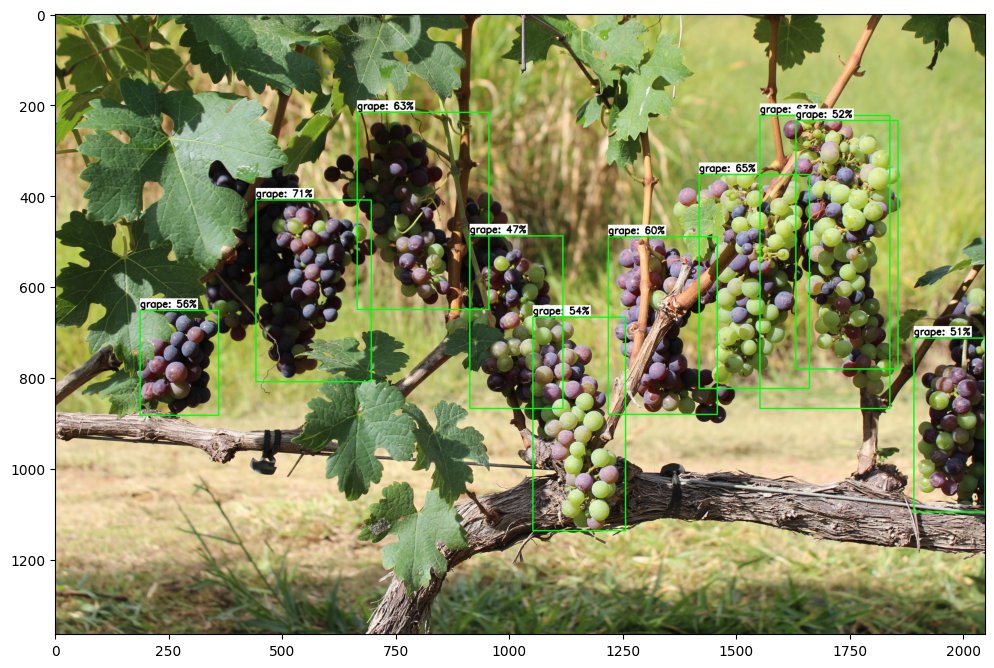

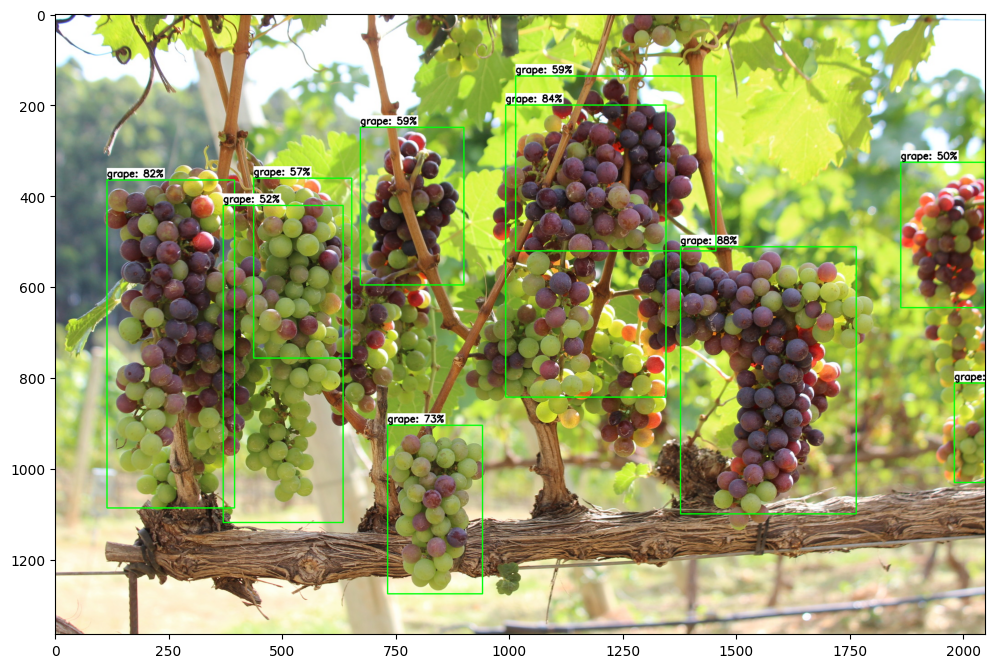

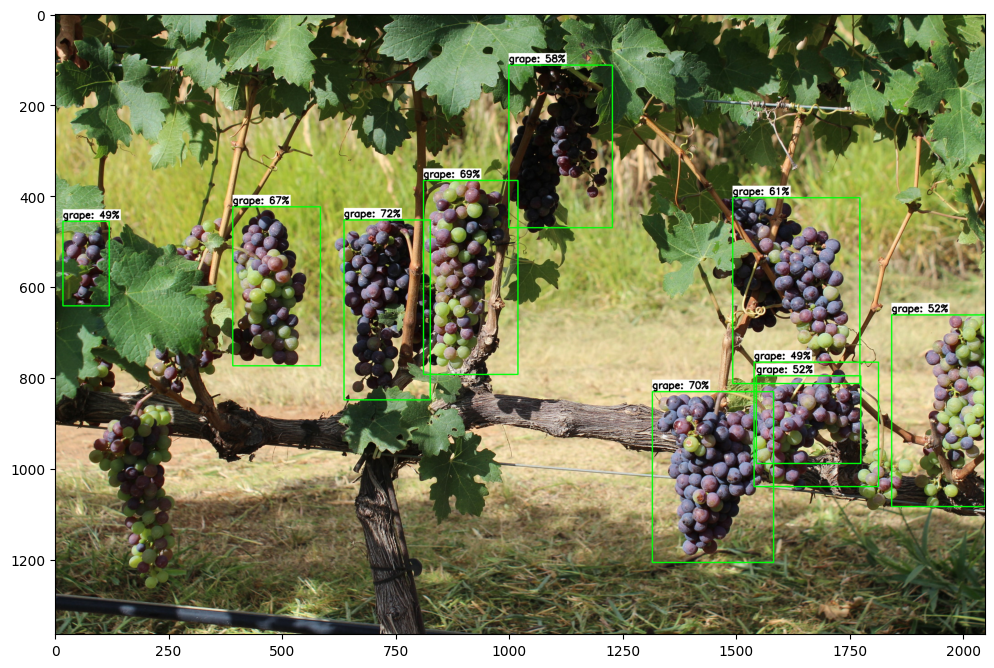

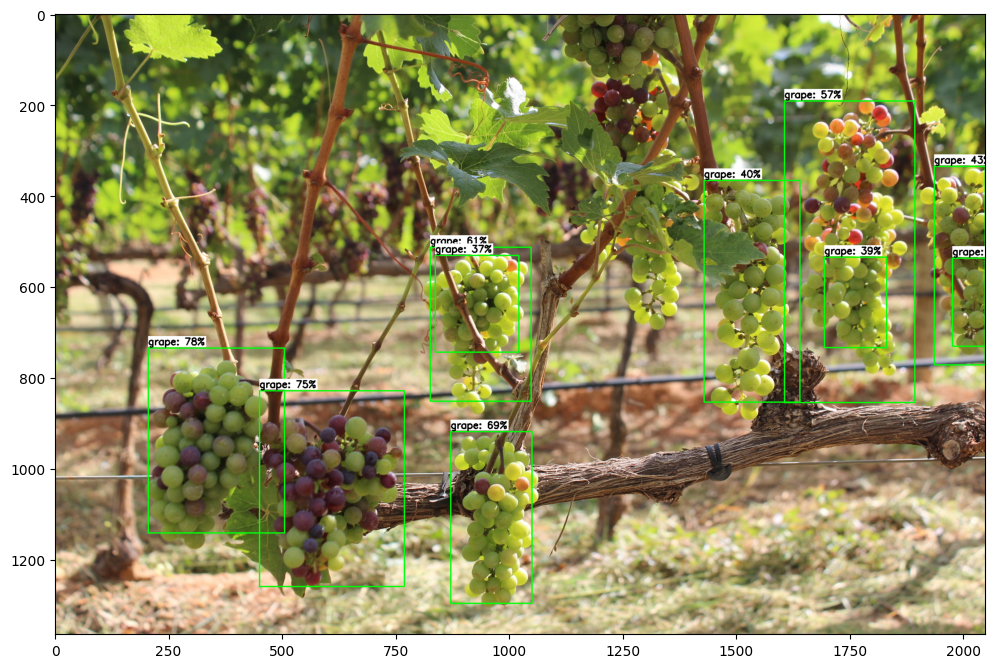

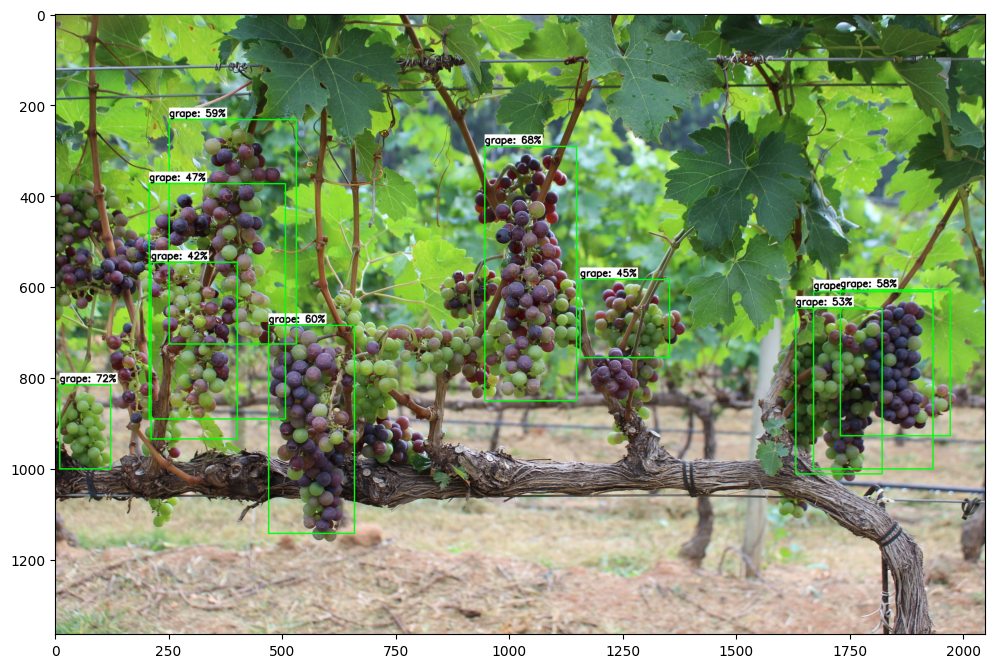

In [ ]:
# Set up variables for running user's model
PATH_TO_IMAGES='/content/Prepared_Grape_DS_Divisions/test'   # Path to test images folder
PATH_TO_MODEL='/content/custom_model_lite/detect.tflite'   # Path to .tflite model file
PATH_TO_LABELS='/content/labelmap.txt'   # Path to labelmap.txt file
min_conf_threshold=0.3   # Confidence threshold (try changing this to 0.01 if you don't see any detection results)
images_to_test = 5   # Number of images to run detection on

# Run inferencing function!
tflite_detect_images(PATH_TO_MODEL, PATH_TO_IMAGES, PATH_TO_LABELS, min_conf_threshold, images_to_test)